In [9]:
import gym
import numpy as np
import random
import time
import matplotlib.pyplot as plt

In [2]:
envName = "Acrobot-v1"
env = gym.make(envName)
env.reset()
actionSize = env.action_space.n
actionSize
stateSize = len(env.observation_space.low)
env.action_space.n


3

In [3]:
lr = 0.05
discount = 0.95
BUCKET_SIZE = 20
bucket_sizes = [BUCKET_SIZE] * stateSize
QTable = np.random.randn(*bucket_sizes,actionSize)
QTable.shape


(20, 20, 20, 20, 20, 20, 3)

In [4]:
discreteOS = [18] * stateSize
discreteWinSize = (env.observation_space.high - env.observation_space.low) / discreteOS


In [5]:
def getDiscreteState(state):
    discreteState = (state - env.observation_space.low) / discreteWinSize
    return tuple(discreteState.astype(int))
discreteState = getDiscreteState(env.reset())
discreteState

(17, 8, 17, 9, 9, 8)

In [127]:
cosTheta1Space = np.linspace(-1,1, 20)
sineTheta1Space = np.linspace(-1,1, 20)
cosTheta2Space = np.linspace(-1,1, 20)
sineTheta2Spcae = np.linspace(-1,1, 20)
vel1 = np.linspace(-12.567, 12.567, 20)
vel2 = np.linspace(-28.274, 28.274, 20)
def getDiscreteState(observation):
    c1, s1, c2, s2, v1, v2 = observation
    c1 = int(np.digitize(c1, cosTheta1Space))
    s1 = int(np.digitize(s1, sineTheta1Space))
    c2 = int(np.digitize(c2, cosTheta2Space))
    s2 = int(np.digitize(s2, sineTheta2Spcae))
    v1 = int(np.digitize(v1, vel1))
    v2 = int(np.digitize(v2, vel2))
    

    return (c1, s1, c2, s2, v1, v2)
getDiscreteState(env.reset())

(19, 11, 19, 11, 10, 10)

In [146]:
done = False
discreteState = getDiscreteState(env.reset())
discreteState
env = gym.make(envName)
env.reset()
while not done:
    action = np.argmax(QTable[discreteState])
    newState, reward, done, _ = env.step(action)
    newDiscreteState = getDiscreteState(newState)
    env.render()

    if not done:
        futureQ = np.max(QTable[newDiscreteState])
        currentQ = QTable[discreteState + (action,)]
        newQ = (1 - lr) * currentQ + lr * (reward + discount * futureQ)
        QTable[discreteState + (action,)] = newQ
    elif newState[0] > 1:
        print('success')
        QTable[discreteState + (action,)] = 0

    discreteState = newDiscreteState

env.close()

In [6]:
Episodes = 5000
showEvery = 100
epsilon = 1
initialEpsDecay = 1
endEpsDecay = Episodes // 5
epsDecaValue = epsilon / (endEpsDecay - initialEpsDecay)
lr = 0.5
discount = 0.95


In [7]:
def train(Episodes, lr, discount, decayRate):
    QTable = np.random.randn(*bucket_sizes,actionSize)
    initialEpsDecay = 1
    epsilon = 1
    endEpsDecay = Episodes // decayRate
    epsDecaValue = epsilon / (endEpsDecay - initialEpsDecay)

    rewards = []
    eps = []
    env = gym.make(envName)
    env.reset()
    for ep in range(Episodes):
        discreteState = getDiscreteState(env.reset())
        done = False
        epReward = 0
        
        while not done:
            if np.random.random() > epsilon:
                action = np.argmax(QTable[discreteState])
            else:
                action = np.random.randint(0, actionSize)
                #print('exploring')

            newState, reward, done, _  = env.step(action)
            newDiscreteState = getDiscreteState(newState)
            cosTheta1 = newState[0]
            cosTheta2 = newState[2]
            theta1 = np.arccos(cosTheta1)
            theta2 = np.arccos(cosTheta2)
            height = -cosTheta1 - np.cos(theta1 + theta2)
            epReward += reward

            '''if ep % showEvery == 0:
                env.render()'''

            if not done:
                maxFutureQ = np.max(QTable[newDiscreteState])
                currentQ = QTable[discreteState + (action,)]
                newQ = (1 - lr) * currentQ + lr * (reward + discount * maxFutureQ)
                QTable[discreteState + (action,)] = newQ
            
            elif height > 1.0:
                print('success')
                QTable[discreteState + (action,)] = 30 # reward

            discreteState = newDiscreteState

            if (ep == Episodes-1):
                env.render()

        print("Episode %d, Reward: %d" % (ep, epReward))
        rewards.append(epReward)
        if endEpsDecay >= ep >= initialEpsDecay:
            print('decaying epsilon: %f' % epsilon)
            epsilon -= epsDecaValue


        eps.append(epsilon)

    

    env.close()
    return rewards, QTable

def displayGame(QTable):
    env = gym.make(envName)
    done = False
    discreteState = getDiscreteState(env.reset())
    while not done:
        action = np.argmax(QTable[discreteState])
        new_state, reward, done, _ = env.step(action)    
        env.render()

    env.close()


In [181]:
# Learning rate 0.2
# stop exploring after 50%
rewards, QTable = train(10000, 0.5, 0.9, 5)

Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999500
Episode 3, Reward: -500
decaying epsilon: 0.998999
Episode 4, Reward: -500
decaying epsilon: 0.998499
Episode 5, Reward: -500
decaying epsilon: 0.997999
Episode 6, Reward: -500
decaying epsilon: 0.997499
Episode 7, Reward: -500
decaying epsilon: 0.996998
Episode 8, Reward: -500
decaying epsilon: 0.996498
Episode 9, Reward: -500
decaying epsilon: 0.995998
Episode 10, Reward: -500
decaying epsilon: 0.995498
Episode 11, Reward: -500
decaying epsilon: 0.994997
Episode 12, Reward: -500
decaying epsilon: 0.994497
Episode 13, Reward: -500
decaying epsilon: 0.993997
Episode 14, Reward: -500
decaying epsilon: 0.993497
Episode 15, Reward: -500
decaying epsilon: 0.992996
Episode 16, Reward: -500
decaying epsilon: 0.992496
Episode 17, Reward: -500
decaying epsilon: 0.991996
Episode 18, Reward: -500
decaying epsilon: 0.991496
Episode 19, Reward: -500
decaying epsilon: 0.9909

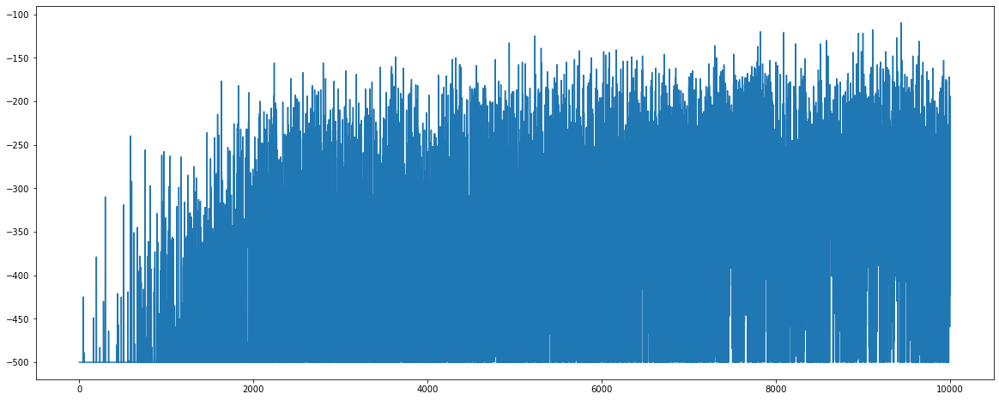

In [183]:
plt.figure(figsize = (20, 8))
plt.plot(rewards[:])

Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999500
Episode 3, Reward: -500
decaying epsilon: 0.998999
Episode 4, Reward: -500
decaying epsilon: 0.998499
Episode 5, Reward: -500
decaying epsilon: 0.997999
Episode 6, Reward: -500
decaying epsilon: 0.997499
Episode 7, Reward: -500
decaying epsilon: 0.996998
Episode 8, Reward: -500
decaying epsilon: 0.996498
Episode 9, Reward: -500
decaying epsilon: 0.995998
Episode 10, Reward: -500
decaying epsilon: 0.995498
Episode 11, Reward: -500
decaying epsilon: 0.994997
Episode 12, Reward: -500
decaying epsilon: 0.994497
Episode 13, Reward: -500
decaying epsilon: 0.993997
Episode 14, Reward: -500
decaying epsilon: 0.993497
Episode 15, Reward: -500
decaying epsilon: 0.992996
Episode 16, Reward: -500
decaying epsilon: 0.992496
Episode 17, Reward: -500
decaying epsilon: 0.991996
Episode 18, Reward: -500
decaying epsilon: 0.991496
Episode 19, Reward: -500
decaying epsilon: 0.9909

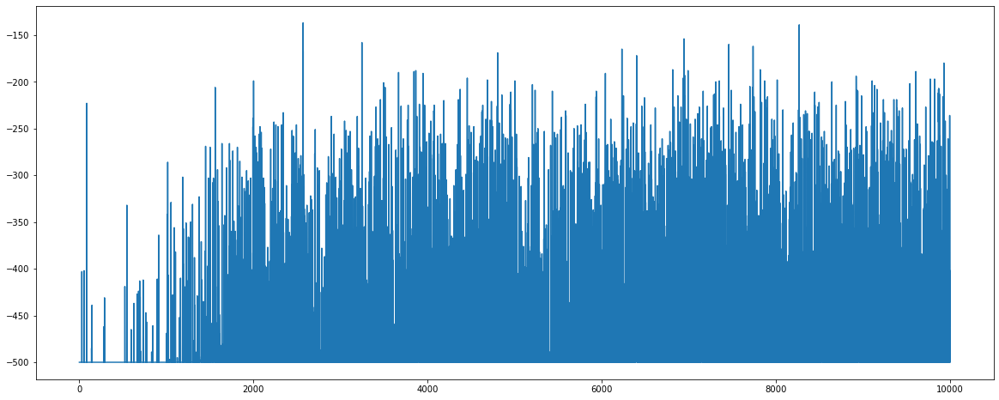

In [172]:
rewards, QTable1 = train(10000, 1, 0.9, 5)
plt.figure(figsize = (20, 8))
plt.plot(rewards)


Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999500
Episode 3, Reward: -500
decaying epsilon: 0.998999
Episode 4, Reward: -500
decaying epsilon: 0.998499
Episode 5, Reward: -500
decaying epsilon: 0.997999
Episode 6, Reward: -500
decaying epsilon: 0.997499
Episode 7, Reward: -500
decaying epsilon: 0.996998
Episode 8, Reward: -500
decaying epsilon: 0.996498
Episode 9, Reward: -500
decaying epsilon: 0.995998
Episode 10, Reward: -500
decaying epsilon: 0.995498
Episode 11, Reward: -500
decaying epsilon: 0.994997
Episode 12, Reward: -500
decaying epsilon: 0.994497
Episode 13, Reward: -500
decaying epsilon: 0.993997
Episode 14, Reward: -500
decaying epsilon: 0.993497
Episode 15, Reward: -500
decaying epsilon: 0.992996
Episode 16, Reward: -500
decaying epsilon: 0.992496
Episode 17, Reward: -500
decaying epsilon: 0.991996
Episode 18, Reward: -500
decaying epsilon: 0.991496
Episode 19, Reward: -500
decaying epsilon: 0.9909

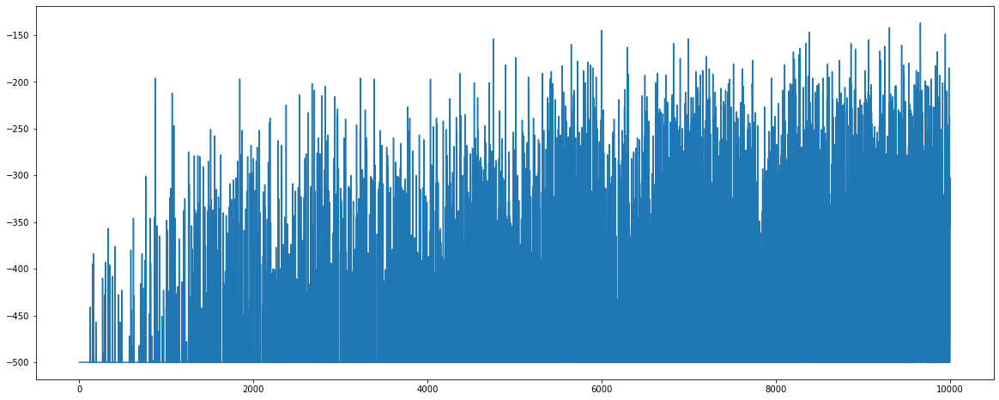

In [173]:
rewards, QTable1 = train(10000, 0.05, 0.9, 5)
plt.figure(figsize = (20, 8))
plt.plot(rewards)

Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.888889
Episode 3, Reward: -500
decaying epsilon: 0.777778
Episode 4, Reward: -500
decaying epsilon: 0.666667
Episode 5, Reward: -500
decaying epsilon: 0.555556
Episode 6, Reward: -500
decaying epsilon: 0.444444
Episode 7, Reward: -500
decaying epsilon: 0.333333
Episode 8, Reward: -500
decaying epsilon: 0.222222
Episode 9, Reward: -500
decaying epsilon: 0.111111
Episode 10, Reward: -500
decaying epsilon: -0.000000
Episode 11, Reward: -500
Episode 12, Reward: -500
Episode 13, Reward: -500
Episode 14, Reward: -500
Episode 15, Reward: -500
Episode 16, Reward: -500
Episode 17, Reward: -500
Episode 18, Reward: -500
Episode 19, Reward: -500
Episode 20, Reward: -500
Episode 21, Reward: -500
Episode 22, Reward: -500
Episode 23, Reward: -500
Episode 24, Reward: -500
Episode 25, Reward: -500
Episode 26, Reward: -500
Episode 27, Reward: -500
Episode 28, Reward: -500
Episode 29, Re

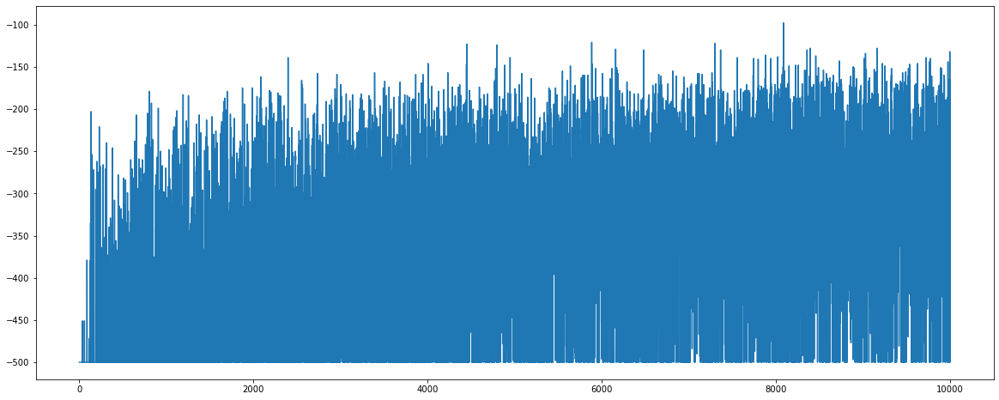

In [179]:
rewards, QTable1 = train(10000, 0.5, 0.99, 1000)
plt.figure(figsize = (20, 8))
plt.plot(rewards)

Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999500
Episode 3, Reward: -500
decaying epsilon: 0.998999
Episode 4, Reward: -500
decaying epsilon: 0.998499
Episode 5, Reward: -500
decaying epsilon: 0.997999
Episode 6, Reward: -500
decaying epsilon: 0.997499
Episode 7, Reward: -500
decaying epsilon: 0.996998
Episode 8, Reward: -500
decaying epsilon: 0.996498
Episode 9, Reward: -500
decaying epsilon: 0.995998
Episode 10, Reward: -500
decaying epsilon: 0.995498
Episode 11, Reward: -500
decaying epsilon: 0.994997
Episode 12, Reward: -500
decaying epsilon: 0.994497
Episode 13, Reward: -500
decaying epsilon: 0.993997
Episode 14, Reward: -500
decaying epsilon: 0.993497
Episode 15, Reward: -500
decaying epsilon: 0.992996
Episode 16, Reward: -500
decaying epsilon: 0.992496
Episode 17, Reward: -500
decaying epsilon: 0.991996
Episode 18, Reward: -500
decaying epsilon: 0.991496
Episode 19, Reward: -500
decaying epsilon: 0.9909

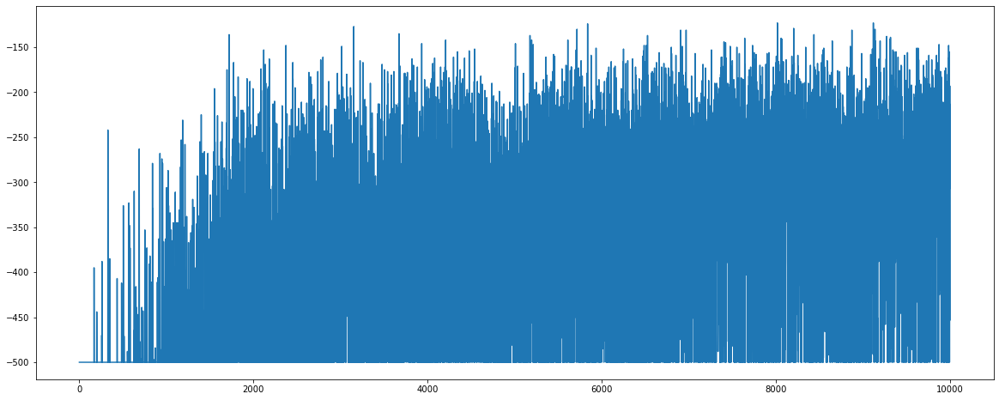

In [174]:
rewards, QTable1 = train(10000, 0.5, 0.99, 5)
plt.figure(figsize = (20, 8))
plt.plot(rewards)

Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999800
Episode 3, Reward: -500
decaying epsilon: 0.999600
Episode 4, Reward: -500
decaying epsilon: 0.999400
Episode 5, Reward: -500
decaying epsilon: 0.999200
Episode 6, Reward: -500
decaying epsilon: 0.999000
Episode 7, Reward: -500
decaying epsilon: 0.998800
Episode 8, Reward: -500
decaying epsilon: 0.998600
Episode 9, Reward: -500
decaying epsilon: 0.998400
Episode 10, Reward: -500
decaying epsilon: 0.998200
Episode 11, Reward: -500
decaying epsilon: 0.998000
Episode 12, Reward: -500
decaying epsilon: 0.997800
Episode 13, Reward: -500
decaying epsilon: 0.997600
Episode 14, Reward: -500
decaying epsilon: 0.997399
Episode 15, Reward: -500
decaying epsilon: 0.997199
Episode 16, Reward: -500
decaying epsilon: 0.996999
Episode 17, Reward: -500
decaying epsilon: 0.996799
Episode 18, Reward: -500
decaying epsilon: 0.996599
Episode 19, Reward: -500
decaying epsilon: 0.9963

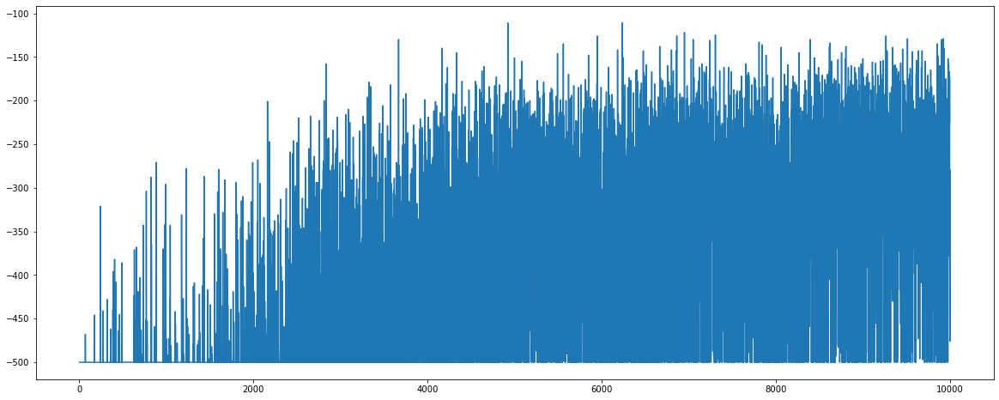

In [175]:
rewards, QTable1 = train(10000, 0.5, 0.99, 2)
plt.figure(figsize = (20, 8))
plt.plot(rewards)

In [8]:
rewards, QTable1 = train(10000, 0.5, 0.01, 5)


Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999500
Episode 3, Reward: -500
decaying epsilon: 0.998999
Episode 4, Reward: -500
decaying epsilon: 0.998499
Episode 5, Reward: -500
decaying epsilon: 0.997999
Episode 6, Reward: -500
decaying epsilon: 0.997499
Episode 7, Reward: -500
decaying epsilon: 0.996998
Episode 8, Reward: -500
decaying epsilon: 0.996498
Episode 9, Reward: -500
decaying epsilon: 0.995998
Episode 10, Reward: -500
decaying epsilon: 0.995498
Episode 11, Reward: -500
decaying epsilon: 0.994997
Episode 12, Reward: -500
decaying epsilon: 0.994497
Episode 13, Reward: -500
decaying epsilon: 0.993997
Episode 14, Reward: -500
decaying epsilon: 0.993497
Episode 15, Reward: -500
decaying epsilon: 0.992996
Episode 16, Reward: -500
decaying epsilon: 0.992496
Episode 17, Reward: -500
decaying epsilon: 0.991996
Episode 18, Reward: -500
decaying epsilon: 0.991496
Episode 19, Reward: -500
decaying epsilon: 0.9909

NameError: name 'plt' is not defined

Episode 0, Reward: -500
Episode 1, Reward: -500
decaying epsilon: 1.000000
Episode 2, Reward: -500
decaying epsilon: 0.999980
Episode 3, Reward: -500
decaying epsilon: 0.999960
Episode 4, Reward: -500
decaying epsilon: 0.999940
Episode 5, Reward: -500
decaying epsilon: 0.999920
Episode 6, Reward: -500
decaying epsilon: 0.999900
Episode 7, Reward: -500
decaying epsilon: 0.999880
Episode 8, Reward: -500
decaying epsilon: 0.999860
Episode 9, Reward: -500
decaying epsilon: 0.999840
Episode 10, Reward: -500
decaying epsilon: 0.999820
Episode 11, Reward: -500
decaying epsilon: 0.999800
Episode 12, Reward: -500
decaying epsilon: 0.999780
Episode 13, Reward: -500
decaying epsilon: 0.999760
Episode 14, Reward: -500
decaying epsilon: 0.999740
Episode 15, Reward: -500
decaying epsilon: 0.999720
Episode 16, Reward: -500
decaying epsilon: 0.999700
Episode 17, Reward: -500
decaying epsilon: 0.999680
Episode 18, Reward: -500
decaying epsilon: 0.999660
Episode 19, Reward: -500
decaying epsilon: 0.9996

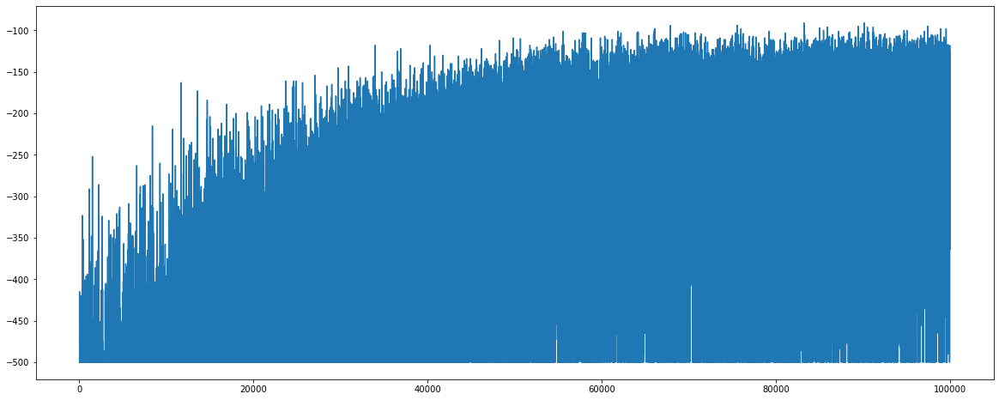

In [11]:
rewards, QTable1 = train(100000, 0.5, 0.99, 2)


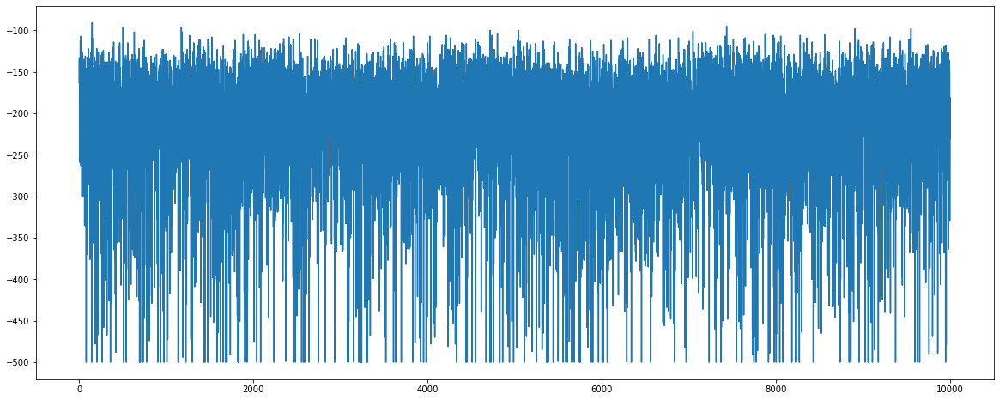

In [12]:
plt.figure(figsize = (20, 8))
plt.plot(rewards[90000:])

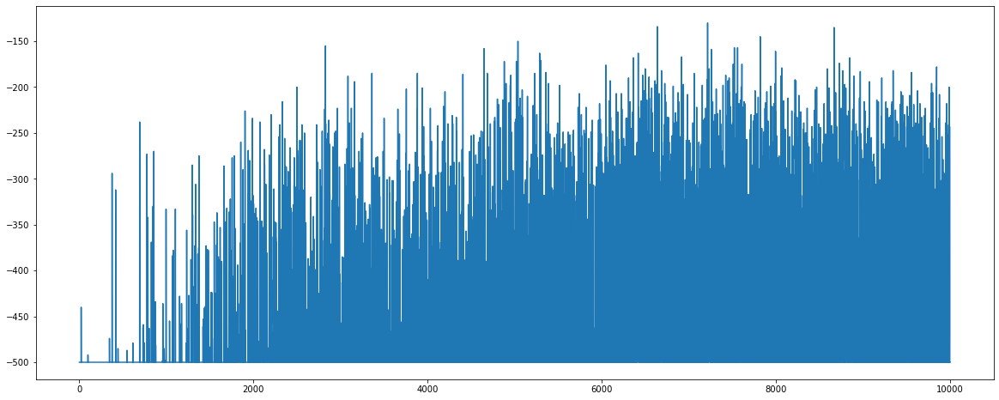

In [10]:
plt.figure(figsize = (20, 8))
plt.plot(rewards)

In [177]:
cosTheta1 = newState[0]
cosTheta2 = newState[2]
theta1 = np.arccos(cosTheta1)
theta2 = np.arccos(cosTheta2)
height = -cosTheta1 - np.cos(theta1 + theta2)
height
np.random.random()
QTable[discreteState]

array([-8.82262783, -9.05072803, -9.04429111])

# Policy Gradient
source: https://github.com/BY571/Deep-Reinforcement-Learning-Algorithm-Collection/blob/master/Policy%20Gradient%20Algorithms/REINFORCE/REINFORCE.py


In [6]:
import torch.nn as nn
import torch
import torch.optim as optim
from torch.autograd import Variable
import gym
from gym import wrappers
import numpy as np
import matplotlib.pyplot as plt
from torch.distributions import Categorical

Episode: 0 --- Rewards: -500.0 --- Steps: 500
Episode: 1 --- Rewards: -500.0 --- Steps: 500
Episode: 2 --- Rewards: -500.0 --- Steps: 500
Episode: 3 --- Rewards: -500.0 --- Steps: 500
Episode: 4 --- Rewards: -500.0 --- Steps: 500
Episode: 5 --- Rewards: -500.0 --- Steps: 500
Episode: 6 --- Rewards: -500.0 --- Steps: 500
Episode: 7 --- Rewards: -500.0 --- Steps: 500
Episode: 8 --- Rewards: -500.0 --- Steps: 500
Episode: 9 --- Rewards: -500.0 --- Steps: 500
Episode: 10 --- Rewards: -500.0 --- Steps: 500
Episode: 11 --- Rewards: -500.0 --- Steps: 500
Episode: 12 --- Rewards: -500.0 --- Steps: 500
Episode: 13 --- Rewards: -500.0 --- Steps: 500
Episode: 14 --- Rewards: -500.0 --- Steps: 500
Episode: 15 --- Rewards: -500.0 --- Steps: 500
Episode: 16 --- Rewards: -500.0 --- Steps: 500
Episode: 17 --- Rewards: -500.0 --- Steps: 500
Episode: 18 --- Rewards: -500.0 --- Steps: 500
Episode: 19 --- Rewards: -500.0 --- Steps: 500
Episode: 20 --- Rewards: -500.0 --- Steps: 500
Episode: 21 --- Rewards

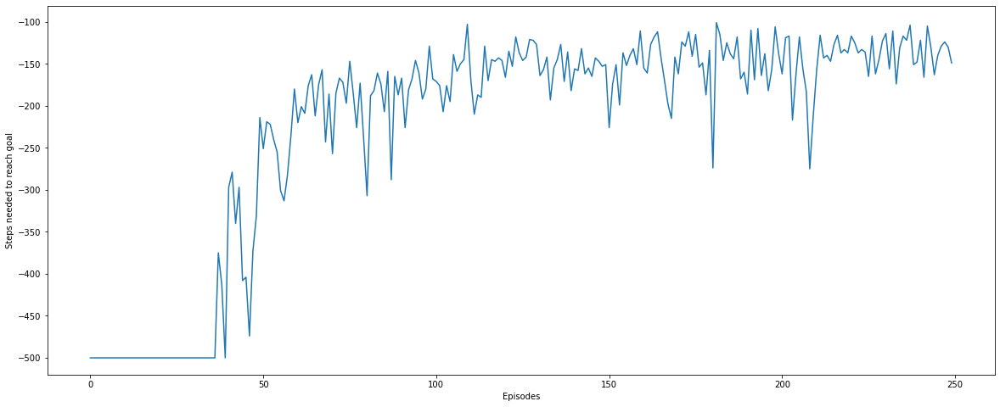

In [7]:
class Policy(nn.Module):
  def __init__(self,input_shape,action_shape):
    super().__init__()
    
    self.model = nn.Sequential(
        nn.Linear(input_shape[0],64),
        nn.ReLU(),
        nn.Linear(64,32),
        nn.ReLU(),
        nn.Linear(32,action_shape),
        nn.Softmax(dim = 1)
    )
  def forward(self,x):
    return self.model(x)    

def action(model, s):
  # simple pytorch aproach for action-selection and log-prob calc 
  #https://pytorch.org/docs/stable/distributions.html
  prob = model(s)
  m = Categorical(prob)
  a = m.sample()
  # log p(a∣π(s))
  log_p = m.log_prob(a)
  #print(a.item(), log_p)
  return a.item(), log_p



def policy_optimization(ep, model, optimizer,batch_rewards,log_probs):
  R = 0
  gamma = 0.99
  policy_loss = []
  rewards = []
  #calc discounted Rewards
  for r in batch_rewards[::-1]: # reverses the list of rewards 
    R = r + gamma * R
    rewards.insert(0, R) # inserts the current reward to first position
    
  rewards = torch.tensor(rewards)
  # standardization to get data of zero mean and varianz 1, stabilizes learning 
  #-- attention scaling rewards looses information of special events with higher rewards - addapting on different environments  
  rewards = (rewards - rewards.mean()) / (rewards.std() + ep)
  for log_prob, reward in zip(log_probs, rewards):
    policy_loss.append(-log_prob * reward) #baseline+
  
  optimizer.zero_grad()
  policy_loss = torch.cat(policy_loss).sum()
  policy_loss.backward()
  optimizer.step()
  
def run(episodes,model,env):
  optimizer = optim.Adam(model.parameters(), lr = 1e-2)
  rewards = []
  steps_taken = []
  
  for i in range(episodes):
    done = False
    ep_rewards = 0
    batch_rewards = []
    log_probs = []
    state = env.reset()
    steps = 0
    while not done:
      a, log_p = action(model, torch.Tensor(state).unsqueeze(0))
      log_probs.append(log_p)
      new_state, reward, done, info = env.step(a)
      batch_rewards.append(reward)
      ep_rewards += reward
      steps +=1

      state = new_state

      if i == episodes - 1:
        env.render()
      
    rewards.append(ep_rewards)
    steps_taken.append(steps)
    print("Episode: {} --- Rewards: {} --- Steps: {}".format(i, ep_rewards, steps))
    policy_optimization(i, model, optimizer, batch_rewards,log_probs)

  return rewards
  
def main():
  
  env = gym.make("Acrobot-v1")

  obs_shape = env.observation_space.shape
  action_shape = env.action_space.n
  episodes = 250
  model = Policy(obs_shape, action_shape)
  steps = run(episodes, model, env)


  plt.figure(figsize = (20, 8))
  plt.plot(steps)
  plt.xlabel("Episodes")
  plt.ylabel("Steps needed to reach goal")
  plt.show()
main()

In [26]:
done = False
while not done:
    action = random.randint(0,ACTION_SIZE-1)
    new_state, reward, done, _ = env.step(action)    
    #env.render()

True